In [3]:
import torch
from torchvision.models import resnet50, ResNet50_Weights, mobilenet_v3_large, MobileNet_V3_Large_Weights
from torch import nn
from torch import optim
from PIL import Image
import os
import sys
import re
import random 
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torch.optim import lr_scheduler
import cv2
import imageio
from facenet_pytorch import MTCNN
from matplotlib.pyplot import imshow
import numpy as np
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import torch.nn.functional as F
# Import datasets class buat dataloader
project_root = os.path.abspath(os.path.join(os.getcwd(), ".."))
sys.path.append(project_root)
from utils import DataPreprocessing, TripletDataset, DatasetClassification, class_to_image_path, extract_class

D:\anaconda3\envs\deeplearning\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
D:\anaconda3\envs\deeplearning\Lib\site-packages\transformers\utils\hub.py:110: FutureWarning: Using `TRANSFORMERS_CACHE` is deprecated and will be removed in v5 of Transformers. Use `HF_HOME` instead.
  warnings.warn(


In [4]:
# crop_transformer = DataPreprocessing(r"D:\Code\Kuliah\Deep Learning\Tugas 2\model\haarcascade_frontalface_alt.xml")
crop_transformer = DataPreprocessing()

In [5]:
# crop_transformer.transform_folder(
#     data_dir=r"D:\Code\Kuliah\Deep Learning\tugas_2\data\Dataset Sistem Presensi Wajah V1.0\Data Train",
#     output_dir=r"D:\Code\Kuliah\Deep Learning\tugas_2\data\Faces Cropped\Train"
# )

# For test set
crop_transformer.transform_folder(
    data_dir=r"D:\Code\Kuliah\Deep Learning\tugas_2\data\Dataset Sistem Presensi Wajah V1.0\Data Test",
    output_dir=r"D:\Code\Kuliah\Deep Learning\tugas_2\data\Faces Cropped\Test"
)

D:\Code\Kuliah\Deep Learning\tugas_2\data\Dataset Sistem Presensi Wajah V1.0\Data Test\.ipynb_checkpoints
File tidak bisa di load
D:\Code\Kuliah\Deep Learning\tugas_2\data\Dataset Sistem Presensi Wajah V1.0\Data Test\5221911012_Debora_01.jpg
[404, 48, 724, 454]
5221911012_Debora_01.jpg sudah di save
D:\Code\Kuliah\Deep Learning\tugas_2\data\Dataset Sistem Presensi Wajah V1.0\Data Test\5221911012_Debora_02.jpg
[406, 53, 722, 449]
5221911012_Debora_02.jpg sudah di save
D:\Code\Kuliah\Deep Learning\tugas_2\data\Dataset Sistem Presensi Wajah V1.0\Data Test\5221911012_Debora_09.jpg
[517, 92, 876, 542]
5221911012_Debora_09.jpg sudah di save
D:\Code\Kuliah\Deep Learning\tugas_2\data\Dataset Sistem Presensi Wajah V1.0\Data Test\5221911012_Debora_10.jpg
[468, 106, 803, 554]
5221911012_Debora_10.jpg sudah di save
D:\Code\Kuliah\Deep Learning\tugas_2\data\Dataset Sistem Presensi Wajah V1.0\Data Test\5221911012_Debora_24.jpg
[382, 66, 656, 434]
5221911012_Debora_24.jpg sudah di save
D:\Code\Kuliah

# **Dataloader**

## **Untuk triplet dataset**

In [2]:
# Example transforms and DataLoader configuration
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5228, 0.4082, 0.3571], std=[0.1984, 0.1681, 0.1524]),
    transforms.RandomRotation(15),
    transforms.RandomHorizontalFlip(),  # flip horizontally
    transforms.ColorJitter(brightness=0.2, contrast=0.2),  # adjust brightness/contrast
])


train_dataset = TripletDataset(
    data_dir=r"D:\Code\Kuliah\Deep Learning\tugas_2\data\Faces Cropped\Train",
    extract_class_fn=extract_class,
    class_to_image_path_fn=class_to_image_path,
    transform=transform
)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

# Test dataset and loader (Faces Cropped)
test_dataset = TripletDataset(
    data_dir=r"D:\Code\Kuliah\Deep Learning\tugas_2\data\Faces Cropped\Test",
    extract_class_fn=extract_class,
    class_to_image_path_fn=class_to_image_path,
    transform=transform
)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)


## **Untuk classifier dan arcface dataset**

In [18]:
# Example transforms and DataLoader configuration
transform_train = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomApply([
        transforms.GaussianBlur(kernel_size=(3, 5), sigma=(0.1, 2.0))
    ], p=0.5),  # 50% chance to apply blur
    # transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5228, 0.4082, 0.3571], std=[0.1984, 0.1681, 0.1524]),
])
transform_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5228, 0.4082, 0.3571], std=[0.1984, 0.1681, 0.1524]),
])

# # Train dataset and loader
train_classifier_dataset = DatasetClassification(
    data_dir=r"D:\Code\Kuliah\Deep Learning\tugas_2\data\Faces Cropped\Train",
    extract_class_fn=extract_class,
    class_to_image_path_fn=class_to_image_path,
    transform=transform_train
)
train_classifier_loader = DataLoader(train_classifier_dataset, batch_size=32, shuffle=True)

# Test dataset and loader
test_classifier_dataset = DatasetClassification(
    data_dir=r"D:\Code\Kuliah\Deep Learning\tugas_2\data\Faces Cropped\Test",
    extract_class_fn=extract_class,
    class_to_image_path_fn=class_to_image_path,
    transform=transform_test
)
test_classifier_loader = DataLoader(test_classifier_dataset, batch_size=32, shuffle=False)


## **Untuk mobilenet dataset**

In [ ]:
import torch
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.transforms import InterpolationMode

# ===========================
# Transforms for MobileNetV3
# ===========================

# ImageNet normalization for pretrained MobileNetV3
imagenet_mean = [0.485, 0.456, 0.406]
imagenet_std  = [0.229, 0.224, 0.225]

# Train transform with optional augmentations
transform_train_mobilenet = transforms.Compose([
    transforms.Resize((224, 224), interpolation=InterpolationMode.BILINEAR),
    # transforms.RandomApply([
    #     transforms.GaussianBlur(kernel_size=(3, 5), sigma=(0.1, 2.0))
    # ], p=0.5),  # 50% chance to apply blur
    transforms.ToTensor(),
    transforms.Normalize(mean=imagenet_mean, std=imagenet_std),
])

# Test transform (no augmentation)
transform_test_mobilenet = transforms.Compose([
    transforms.Resize((224, 224), interpolation=InterpolationMode.BILINEAR),
    transforms.ToTensor(),
    transforms.Normalize(mean=imagenet_mean, std=imagenet_std),
])

# ===========================
# Datasets and DataLoaders
# ===========================

# Train dataset and loader
train_classifier_dataset_mobilenet = DatasetClassification(
    data_dir=r"D:\Code\Kuliah\Deep Learning\tugas_2\data\Faces Cropped\Train",
    extract_class_fn=extract_class,
    class_to_image_path_fn=class_to_image_path,
    transform=transform_train_mobilenet
)
train_classifier_loader_mobilenet = DataLoader(
    train_classifier_dataset_mobilenet,
    batch_size=32,
    shuffle=True,
    num_workers=4
)

# Test dataset and loader
test_classifier_dataset_mobilenet = DatasetClassification(
    data_dir=r"D:\Code\Kuliah\Deep Learning\tugas_2\data\Faces Cropped\Test",
    extract_class_fn=extract_class,
    class_to_image_path_fn=class_to_image_path,
    transform=transform_test_mobilenet
)
test_classifier_loader_mobilenet = DataLoader(
    test_classifier_dataset_mobilenet,
    batch_size=32,
    shuffle=False,
    num_workers=4
)

# Optional: check first batch
imgs, labels = next(iter(train_classifier_loader_mobilenet))
print("Train batch images shape:", imgs.shape)
print("Train batch labels shape:", labels.shape)


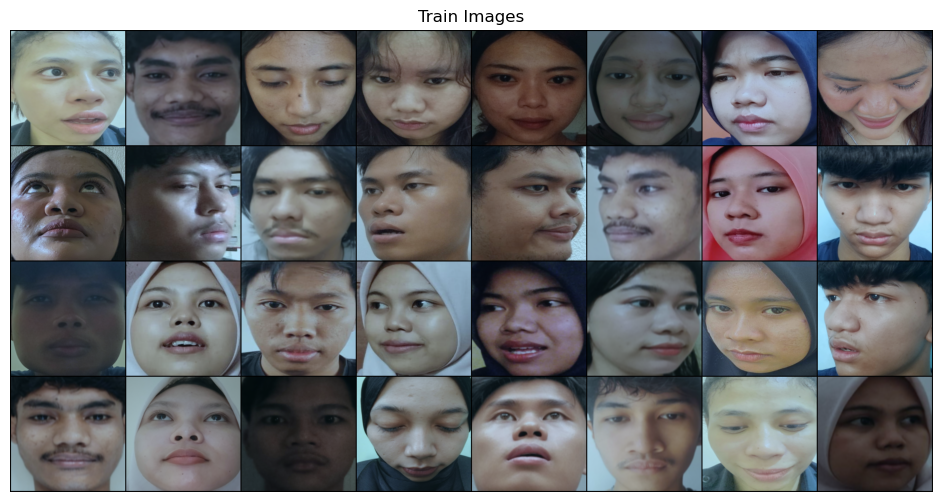

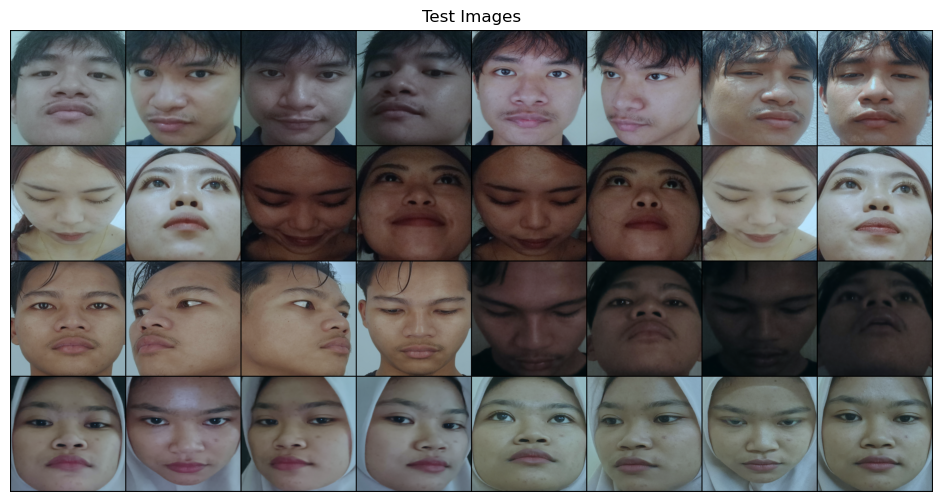

In [7]:
import matplotlib.pyplot as plt
import torchvision

# Function to show a batch of images
def show_batch(loader, title="Images"):
    images, labels = next(iter(loader))  # get a batch
    grid_img = torchvision.utils.make_grid(images, nrow=8, normalize=True)
    plt.figure(figsize=(12,6))
    plt.imshow(grid_img.permute(1, 2, 0))  # convert from CxHxW to HxWxC
    plt.title(title)
    plt.axis('off')
    plt.show()

# Show some training images
show_batch(train_classifier_loader, title="Train Images")

# Show some test images
show_batch(test_classifier_loader, title="Test Images")


In [9]:
model = resnet50(weights=None)
model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

# Model Resnet Embedding

In [8]:
class ResnetFace(nn.Module):
    def __init__(self, embedding_size=128, weights=None):
        super().__init__()
        self.resnet = resnet50(weights=weights)
        self.resnet.fc = nn.Linear(2048, embedding_size)
        if weights is not None:
            for param in self.resnet.parameters():
                param.requires_grad = False
            for param in self.resnet.fc.parameters():
                param.requires_grad = True

    def forward(self, x):
        x = self.resnet(x)
        x = F.normalize(x, p=2, dim=1)
        return x

In [9]:
class EarlyStopping:
    def __init__(self, patience=5, delta=0, verbose=False):
        self.patience = patience
        self.delta = delta
        self.verbose = verbose
        self.best_loss = None
        self.no_improvement_count = 0
        self.stop_training = False
    
    def check_early_stop(self, val_loss):
        if self.best_loss is None or val_loss < self.best_loss - self.delta:
            self.best_loss = val_loss
            self.no_improvement_count = 0
        else:
            self.no_improvement_count += 1
            if self.no_improvement_count >= self.patience:
                self.stop_training = True
                if self.verbose:
                    print("Stopping early as no improvement has been observed.")

# Initialize early stopping
early_stopping = EarlyStopping(patience=5, delta=0.001, verbose=True)

In [7]:
import torch
import torch.nn as nn
import torch.optim as optim

def test_loss_calculation(test_loader, test_dataset, model, criterion):
    # Hitung loss untuk test set
    test_loss = 0.0
    with torch.no_grad():
        for anchor_img, positive_img, negative_img in test_loader:
            anchor_img = anchor_img.to(device)
            positive_img = positive_img.to(device)
            negative_img = negative_img.to(device)

            anchor_out = model(anchor_img)
            positive_out = model(positive_img)
            negative_out = model(negative_img)

            loss = criterion(anchor_out, positive_out, negative_out)
            test_loss += loss.item() * anchor_img.size(0)
    test_loss /= len(test_dataset)
    return test_loss

def training_model(model, train_loader, test_loader, optimizer, criterion, scheduler, early_stopping, num_epoch):
    train_loss_list = []
    test_loss_list = []
    for epoch in range(num_epoch):  # ulangi dataset beberapa kali
        print("Mulai")
        running_loss = 0.0
        for i, data in enumerate(train_loader, 0):
            # print(f'Batch ke {i}')
            # ambil triplet
            anchor_img, positive_img, negative_img = data
            anchor_img = anchor_img.to(device)
            positive_img = positive_img.to(device)
            negative_img = negative_img.to(device)

            optimizer.zero_grad()

            # forward pass
            anchor_out = model(anchor_img)
            positive_out = model(positive_img)
            negative_out = model(negative_img)

            # hitung loss triplet
            loss = criterion(anchor_out, positive_out, negative_out)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * anchor_img.size(0)
            # cetak statistik setiap beberapa batch
            if i % 5 == 0:
                print(f"[Epoch {epoch+1}, Batch {i+1}] Loss: {loss.item():.4f}")
        print(f"Epoch {epoch+1} sudah selesai")
        scheduler.step()
        
        test_loss =  test_loss_calculation(test_loader, test_loader.dataset, model, criterion)
        print(f"[Epoch {epoch+1},] Test Loss: {test_loss:.4f}")

        running_loss /= len(train_loader.dataset)
    
        # selesai 1 epoch
        print(f"[Epoch {epoch+1}] Training Loss terakhir: {running_loss:.4f}")

        train_loss_list.append(running_loss)
        test_loss_list.append(test_loss)
        
        early_stopping.check_early_stop(test_loss)
        
        if early_stopping.stop_training:
            print(f"Early stopping di epoch {epoch+1}")
            break
        

    # Hitung loss untuk test set
    test_loss =  test_loss_calculation(test_loader, test_loader.dataset, model, criterion)

    print(f"[Epoch {epoch+1}] Loss rata-rata test: {test_loss:.4f}\n")

    print("Selesai training!")

    # plot loss 
    plt.figure(figsize=(8, 5))
    plt.plot(train_loss_list, label='Training Loss')
    plt.plot(test_loss_list, label='Test Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training & Test Loss Curve')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    return test_loss

# Model Arsitektur Resnet50 bukan pretrained

## Melakukan Course Search Untuk Mencari LR dan WD terbaik

In [43]:
print("="*60)
print("Memulai training menggunakan arsitektur ResNet-50 (bobot dari awal, bukan pretrained)")
print("="*60)

best_test_loss = float("inf")
best_model_state = None

# Pencarian hyperparameter
for i in range(10):
    # Learning rate dan weight decay acak
    lr = 10**random.uniform(2,-6)
    reg = 10**random.uniform(-5,5)

    print(f"\n--- Percobaan {i+1}/10 ---")
    print(f"Learning rate: {lr:.2e} | Weight decay: {reg:.2e}")

    # Model
    model = ResnetFace(embedding_size=128, weights=None)  # output embedding dimension = 128

    # Loss
    criterion = nn.TripletMarginLoss(margin=1.0, p=2)

    # Optimizer
    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=reg)

    # Scheduler learning rate
    exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

    # Early stopping
    early_stopping = EarlyStopping(patience=5, delta=0.001, verbose=True)
    
    # Device
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model.to(device)
    
    # Train
    test_loss = training_model(
        model=model,
        train_loader=train_loader,
        test_loader=test_loader,
        optimizer=optimizer,
        criterion=criterion,
        early_stopping=early_stopping,
        num_epoch=3,
        scheduler=exp_lr_scheduler
    )

    print(f"Percobaan {i+1} | Test Loss: {test_loss:.4f}")

    # Simpan model terbaik
    if test_loss < best_test_loss:
        best_test_loss = test_loss
        best_model_state = model.state_dict()
        print(f"🎉 Model terbaik baru dengan Test Loss: {best_test_loss:.4f}")

print("\n" + "="*60)
print(f"Test Loss terbaik: {best_test_loss:.4f}")
print("="*60)

# Simpan model terbaik
torch.save(best_model_state, "best_resnet_face_embedding_course_search.pth")
print("Model terbaik disimpan sebagai 'best_resnet_face_embedding_course_search.pth'")

Memulai training menggunakan arsitektur ResNet-50 (bobot dari awal, bukan pretrained)

--- Percobaan 1/10 ---
Learning rate: 4.34e-01 | Weight decay: 2.99e-05
Mulai
[Epoch 1, Batch 1] Loss: 0.9209
[Epoch 1, Batch 6] Loss: 1.0130
[Epoch 1, Batch 11] Loss: 0.8820
[Epoch 1, Batch 16] Loss: 0.9924
[Epoch 1, Batch 21] Loss: 0.9632
[Epoch 1, Batch 26] Loss: 0.9592
[Epoch 1, Batch 31] Loss: 0.8800
[Epoch 1, Batch 36] Loss: 0.5119
[Epoch 1, Batch 41] Loss: 0.5959
[Epoch 1, Batch 46] Loss: 0.8600
[Epoch 1, Batch 51] Loss: 0.6647
Epoch 1 sudah selesai
[Epoch 1,] Test Loss: 0.8657
Mulai
[Epoch 2, Batch 1] Loss: 0.9442
[Epoch 2, Batch 6] Loss: 0.7844
[Epoch 2, Batch 11] Loss: 0.9554
[Epoch 2, Batch 16] Loss: 0.6849
[Epoch 2, Batch 21] Loss: 0.7901
[Epoch 2, Batch 26] Loss: 0.9039
[Epoch 2, Batch 31] Loss: 0.7223
[Epoch 2, Batch 36] Loss: 1.1158
[Epoch 2, Batch 41] Loss: 0.9238
[Epoch 2, Batch 46] Loss: 0.8966
[Epoch 2, Batch 51] Loss: 0.8657
Epoch 2 sudah selesai
[Epoch 2,] Test Loss: 0.7856
Mulai

In [16]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
from torchvision.models import resnet50, ResNet50_Weights
import random

print("="*60)
print("Memulai training menggunakan arsitektur ResNet-50 (pretrained ImageNet)")
print("="*60)

# Model dengan pretrained ImageNet weights
model = ResnetFace(embedding_size=128, weights=ResNet50_Weights.IMAGENET1K_V2)

# Loss
criterion = nn.TripletMarginLoss(margin=1.0, p=2)

# Optimizer
optimizer = optim.Adam(model.parameters(), lr=6.14e-02, weight_decay=8.86e-05)

# Scheduler learning rate
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

# Early stopping
early_stopping = EarlyStopping(patience=5, delta=0.001, verbose=True)

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

# Train
test_loss = training_model(
    model=model,
    train_loader=train_loader,
    test_loader=test_loader,
    optimizer=optimizer,
    criterion=criterion,
    early_stopping=early_stopping,
    num_epoch=50,
    scheduler=exp_lr_scheduler
)

print("\n" + "="*60)
print(f"Train Loss: {train_loss:.4f}")
print(f"Test Loss: {test_loss:.4f}")
print("="*60)

# Simpan model terbaik
torch.save(model.state_dict(), r"D:\Code\Kuliah\Deep Learning\Tugas 2\model\best_resnet_face_embedding_imagenet_course.pth")
print("Model terbaik disimpan sebagai 'best_resnet_face_embedding_imagenet_course'")

Memulai training menggunakan arsitektur ResNet-50 (pretrained ImageNet)


NameError: name 'train_loader' is not defined

# Training Menggunakan Arc

In [10]:
class ArcFaceLoss(nn.Module):
    def __init__(self, num_classes, embedding_size, margin, scale):
        """
        ArcFace: Additive Angular Margin Loss for Deep Face Recognition
        (https://arxiv.org/pdf/1801.07698.pdf)
        Args:
            num_classes: The number of classes in your training dataset
            embedding_size: The size of the embeddings that you pass into
            margin: m in the paper, the angular margin penalty in radians
            scale: s in the paper, feature scale
        """
        super().__init__()
        self.num_classes = num_classes
        self.embedding_size = embedding_size
        self.margin = margin
        self.scale = scale
        
        self.W = torch.nn.Parameter(torch.Tensor(num_classes, embedding_size))
        nn.init.xavier_normal_(self.W)
        
    def forward(self, embeddings, labels):
        """
        Args:
            embeddings: (None, embedding_size)
            labels: (None,)
        Returns:
            loss: scalar
        """
        cosine = self.get_cosine(embeddings) # (None, n_classes)
        mask = self.get_target_mask(labels) # (None, n_classes)
        cosine_of_target_classes = cosine[mask == 1] # (None, )
        modified_cosine_of_target_classes = self.modify_cosine_of_target_classes(
            cosine_of_target_classes
        ) # (None, )
        diff = (modified_cosine_of_target_classes - cosine_of_target_classes).unsqueeze(1) # (None,1)
        logits = cosine + (mask * diff) # (None, n_classes)
        logits = self.scale_logits(logits) # (None, n_classes)
        return nn.CrossEntropyLoss()(logits, labels)
        
    def get_cosine(self, embeddings):
        """
        Args:
            embeddings: (None, embedding_size)
        Returns:
            cosine: (None, n_classes)
        """
        cosine = F.linear(F.normalize(embeddings), F.normalize(self.W))
        return cosine
    
    def get_target_mask(self, labels):
        """
        Args:
            labels: (None,)
        Returns:
            mask: (None, n_classes)
        """
        batch_size = labels.size(0)
        onehot = torch.zeros(batch_size, self.num_classes, device=labels.device)
        onehot.scatter_(1, labels.unsqueeze(-1), 1)
        return onehot
        
    def modify_cosine_of_target_classes(self, cosine_of_target_classes):
        """
        Args:
            cosine_of_target_classes: (None,)
        Returns:
            modified_cosine_of_target_classes: (None,)
        """
        eps = 1e-6
        # theta in the paper
        angles = torch.acos(torch.clamp(cosine_of_target_classes, -1 + eps, 1 - eps))
        return torch.cos(angles + self.margin)
    
    def scale_logits(self, logits):
        """
        Args:
            logits: (None, n_classes)
        Returns:
            scaled_logits: (None, n_classes)
        """
        return logits * self.scale
    
class SoftmaxLoss(nn.Module):
    def __init__(self, num_classes, embedding_size):
        """
        Regular softmax loss (1 fc layer without bias + CrossEntropyLoss)
        Args:
            num_classes: The number of classes in your training dataset
            embedding_size: The size of the embeddings that you pass into
        """
        super().__init__()
        self.num_classes = num_classes
        self.embedding_size = embedding_size
        
        self.W = torch.nn.Parameter(torch.Tensor(num_classes, embedding_size))
        nn.init.xavier_normal_(self.W)
        
    def forward(self, embeddings, labels):
        """
        Args:
            embeddings: (None, embedding_size)
            labels: (None,)
        Returns:
            loss: scalar
        """
        logits = F.linear(embeddings, self.W)
        return nn.CrossEntropyLoss()(logits, labels)

In [11]:
import torch
import torch.nn as nn
import torch.optim as optim

def test_loss_calculation(test_loader, test_dataset, model, criterion):
    # Hitung loss untuk test set
    test_loss = 0.0
    with torch.no_grad():
        for image, label in test_loader:
            image = image.to(device)
            
            output = model(image)

            loss = criterion(output, label)
            test_loss += loss.item() * image.size(0)
    test_loss /= len(test_dataset)
    return test_loss

def training_model_arcloss(model, train_loader, test_loader, optimizer, criterion, scheduler, early_stopping, num_epoch):
    train_loss_list = []
    test_loss_list = []
    for epoch in range(num_epoch):  # ulangi dataset beberapa kali
        print("Mulai")
        running_loss = 0.0
        for i, data in enumerate(train_loader, 0):
            # print(f'Batch ke {i}')
            # ambil triplet
            image, label = data
            image, label = image.to(device), label.to(device)
            
            optimizer.zero_grad()

            # forward pass
            output = model(image)

            # hitung loss triplet
            loss = criterion(output, label)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * image.size(0)
            # cetak statistik setiap beberapa batch
            if i % 5 == 0:
                print(f"[Epoch {epoch+1}, Batch {i+1}] Loss: {loss.item():.4f}")
        print(f"Epoch {epoch+1} sudah selesai")
        scheduler.step()

        model.eval()
        test_loss =  test_loss_calculation(test_loader, test_loader.dataset, model, criterion)
        print(f"[Epoch {epoch+1},] Test Loss: {test_loss:.4f}")
        model.train()
        running_loss /= len(train_loader.dataset)
    
        # selesai 1 epoch
        print(f"[Epoch {epoch+1}] Training Loss terakhir: {running_loss:.4f}")

        train_loss_list.append(running_loss)
        test_loss_list.append(test_loss)
        
        early_stopping.check_early_stop(test_loss)
        
        if early_stopping.stop_training:
            print(f"Early stopping di epoch {epoch+1}")
            break
        
    model.eval()
    # Hitung loss untuk test set
    test_loss = test_loss_calculation(test_loader, test_loader.dataset, model, criterion)
    model.train()
    print(f"[Epoch {epoch+1}] Loss rata-rata test: {test_loss:.4f}\n")

    print("Selesai training!")

    # plot loss 
    plt.figure(figsize=(8, 5))
    plt.plot(train_loss_list, label='Training Loss')
    plt.plot(test_loss_list, label='Test Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training & Test Loss Curve')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    return test_loss

## Course Search mencari lr dan wd terbaik untuk facearc resnet

In [64]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
from torchvision.models import resnet50, ResNet50_Weights
import random

print("="*60)
print("Memulai training menggunakan arsitektur ResNet-50 (pretrained ImageNet)")
print("="*60)

best_test_loss = float("inf")
best_model_state = None
best_lr = None
best_reg = None

# Pencarian hyperparameter
for i in range(100):
    # Learning rate dan weight decay acak
    lr = 10**random.uniform(-5, -3)   # 1e-5 → 1e-3
    reg = 10**random.uniform(-6, -3)  # 1e-6 → 1e-3

    print(f"\n--- Percobaan {i+1}/10 ---")
    print(f"Learning rate: {lr:.2e} | Weight decay: {reg:.2e}")

    # Model dengan pretrained ImageNet
    model = ResnetFace(embedding_size=128, weights=ResNet50_Weights.IMAGENET1K_V2)

    # Loss
    criterion = ArcFaceLoss(
        num_classes=54,
        embedding_size=128,
        margin=0.3,
        scale=30.0
    )

    # Optimizer
    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=reg)

    # Scheduler learning rate
    exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

    # Early stopping
    early_stopping = EarlyStopping(patience=5, delta=0.001, verbose=True)

    # Device
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model.to(device)

    # Train
    test_loss = training_model_arcloss(
        model=model,
        train_loader=train_classifier_loader,
        test_loader=test_classifier_loader,
        optimizer=optimizer,
        criterion=criterion,
        early_stopping=early_stopping,
        num_epoch=3,   # only 3 epochs per trial to save time
        scheduler=exp_lr_scheduler
    )

    print(f"Percobaan {i+1} | Test Loss: {test_loss:.4f}")

    # Simpan model terbaik
    if test_loss < best_test_loss:
        best_test_loss = test_loss
        best_model_state = model.state_dict()
        best_lr = lr
        best_reg = reg
        print(f"🎉 Model terbaik baru! Test Loss: {best_test_loss:.4f}")

print("\n" + "="*60)
print(f"Test Loss terbaik: {best_test_loss:.4f}")
print(f"Best LR: {best_lr:.2e} | Best Weight Decay: {best_reg:.2e}")
print("="*60)

# Simpan model terbaik
torch.save(best_model_state, "best_resnet_face_arcface_search.pth")
print("Model terbaik disimpan sebagai 'best_resnet_face_arcface_search.pth'")


Memulai training menggunakan arsitektur ResNet-50 (pretrained ImageNet)

--- Percobaan 1/10 ---
Learning rate: 7.17e-04 | Weight decay: 2.57e-04
Mulai
[Epoch 1, Batch 1] Loss: 16.8668
[Epoch 1, Batch 6] Loss: 13.7078
[Epoch 1, Batch 11] Loss: 11.4565
[Epoch 1, Batch 16] Loss: 11.4935
[Epoch 1, Batch 21] Loss: 10.9533
[Epoch 1, Batch 26] Loss: 9.9221
[Epoch 1, Batch 31] Loss: 9.1730
[Epoch 1, Batch 36] Loss: 9.1459
[Epoch 1, Batch 41] Loss: 7.1651
[Epoch 1, Batch 46] Loss: 6.3429
[Epoch 1, Batch 51] Loss: 5.1820
Epoch 1 sudah selesai
[Epoch 1,] Test Loss: 19.6572
[Epoch 1] Training Loss terakhir: 9.8731
Mulai
[Epoch 2, Batch 1] Loss: 2.2987
[Epoch 2, Batch 6] Loss: 2.8757
[Epoch 2, Batch 11] Loss: 1.5158
[Epoch 2, Batch 16] Loss: 1.2335
[Epoch 2, Batch 21] Loss: 1.0793
[Epoch 2, Batch 26] Loss: 2.8213
[Epoch 2, Batch 31] Loss: 0.7756
[Epoch 2, Batch 36] Loss: 0.3533
[Epoch 2, Batch 41] Loss: 0.8725
[Epoch 2, Batch 46] Loss: 1.1339


KeyboardInterrupt: 

## Finer Search mencari lr dan reg terbaik dari course serach untuk facearc resnet

In [10]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
from torchvision.models import resnet50, ResNet50_Weights
import random

print("="*60)
print("Memulai training menggunakan arsitektur ResNet-50 (pretrained ImageNet)")
print("="*60)

best_test_loss = float("inf")
best_model_state = None
best_lr = None
best_reg = None

# Pencarian hyperparameter
for i in range(100):
    # Learning rate dan weight decay acak
    lr = 10**random.uniform(-3, -4)  
    reg = 10**random.uniform(-4, -6)   

    print(f"\n--- Percobaan {i+1}/10 ---")
    print(f"Learning rate: {lr:.2e} | Weight decay: {reg:.2e}")

    # Model dengan pretrained ImageNet
    model = ResnetFace(embedding_size=128, weights=ResNet50_Weights.IMAGENET1K_V2)

    # Loss
    criterion = ArcFaceLoss(
        num_classes=54,
        embedding_size=128,
        margin=0.3,
        scale=30.0
    )

    # Optimizer
    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=reg)

    # Scheduler learning rate
    exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

    # Early stopping
    early_stopping = EarlyStopping(patience=5, delta=0.001, verbose=True)

    # Device
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model.to(device)

    # Train
    test_loss = training_model_arcloss(
        model=model,
        train_loader=train_classifier_loader,
        test_loader=test_classifier_loader,
        optimizer=optimizer,
        criterion=criterion,
        early_stopping=early_stopping,
        num_epoch=5,   # only 3 epochs per trial to save time
        scheduler=exp_lr_scheduler
    )

    print(f"Percobaan {i+1} | Test Loss: {test_loss:.4f}")

    # Simpan model terbaik
    if test_loss < best_test_loss:
        best_test_loss = test_loss
        best_model_state = model.state_dict()
        best_lr = lr
        best_reg = reg
        print(f"🎉 Model terbaik baru! Test Loss: {best_test_loss:.4f}")

print("\n" + "="*60)
print(f"Test Loss terbaik: {best_test_loss:.4f}")
print(f"Best LR: {best_lr:.2e} | Best Weight Decay: {best_reg:.2e}")
print("="*60)

# Simpan model terbaik 6.78e-04 | Weight decay: 3.91e-06
torch.save(best_model_state, "best_resnet_face_arcface_search.pth")
print("Model terbaik disimpan sebagai 'best_resnet_face_arcface_search.pth'")

Memulai training menggunakan arsitektur ResNet-50 (pretrained ImageNet)

--- Percobaan 1/10 ---
Learning rate: 1.70e-04 | Weight decay: 1.70e-05
Mulai
[Epoch 1, Batch 1] Loss: 15.8794
[Epoch 1, Batch 6] Loss: 14.9099
[Epoch 1, Batch 11] Loss: 13.1972
[Epoch 1, Batch 16] Loss: 12.8929
[Epoch 1, Batch 21] Loss: 12.8657
[Epoch 1, Batch 26] Loss: 12.4571
[Epoch 1, Batch 31] Loss: 11.4246
[Epoch 1, Batch 36] Loss: 11.5010
[Epoch 1, Batch 41] Loss: 11.0944
[Epoch 1, Batch 46] Loss: 11.2233
[Epoch 1, Batch 51] Loss: 11.2801
Epoch 1 sudah selesai
[Epoch 1,] Test Loss: 13.1755
[Epoch 1] Training Loss terakhir: 12.4008
Mulai
[Epoch 2, Batch 1] Loss: 10.2242
[Epoch 2, Batch 6] Loss: 10.1884
[Epoch 2, Batch 11] Loss: 9.5081
[Epoch 2, Batch 16] Loss: 9.1562
[Epoch 2, Batch 21] Loss: 8.4827
[Epoch 2, Batch 26] Loss: 8.4956
[Epoch 2, Batch 31] Loss: 6.6579
[Epoch 2, Batch 36] Loss: 5.8473
[Epoch 2, Batch 41] Loss: 6.3242
[Epoch 2, Batch 46] Loss: 4.7641
[Epoch 2, Batch 51] Loss: 5.5709
Epoch 2 sudah 

KeyboardInterrupt: 

In [141]:
# 7.76e-04 | Weight decay: 6.97e-04
# -4 -6
# -4 -5
# -4 -4
# -4 -6
# -4 -6

SyntaxError: invalid syntax (2584558974.py, line 1)

## Last training

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
from torchvision.models import resnet50, ResNet50_Weights
import random

print("="*60)
print("Memulai training menggunakan arsitektur ResNet-50 (pretrained ImageNet)")
print("="*60)

# Model dengan pretrained ImageNet weights
model = ResnetFace(embedding_size=128, weights=ResNet50_Weights.IMAGENET1K_V2)

# Loss
criterion = ArcFaceLoss(
    num_classes=54, 
    embedding_size=128,
    margin=0.3, 
    scale=30.0
)

# Optimizer
# optimizer = optim.Adam(model.parameters(), lr=6.78e-04, weight_decay=3.91e-06)
optimizer = optim.Adam(model.parameters(), lr=7.76e-04, weight_decay=6.97e-04)
 
# Scheduler learning rate
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

# Early stopping
early_stopping = EarlyStopping(patience=5, delta=0.01, verbose=True)

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

# Train
test_loss = training_model_arcloss(
    model=model,
    train_loader=train_classifier_loader,
    test_loader=test_classifier_loader,
    optimizer=optimizer,
    criterion=criterion,
    early_stopping=early_stopping,
    num_epoch=18,
    scheduler=exp_lr_scheduler
)

print("\n" + "="*60)
print(f"Train Loss: {train_loss:.4f}")
print(f"Test Loss: {test_loss:.4f}")
print("="*60)

# [Epoch 1, Batch 1] Loss: 15.8951
# [Epoch 1, Batch 6] Loss: 14.1157
# [Epoch 1, Batch 11] Loss: 12.1025
# [Epoch 1, Batch 16] Loss: 11.413
# Simpan model terbaik
torch.save(model.state_dict(), r"D:\Code\Kuliah\Deep Learning\tugas_2\model\best_resnet_face_embedding_imagenet_arcface_final_4.pth")
print("Model terbaik disimpan sebagai 'best_resnet_face_embedding_imagenet_arcface_final_2'")

Memulai training menggunakan arsitektur ResNet-50 (pretrained ImageNet)
Mulai
[Epoch 1, Batch 1] Loss: 15.2877
[Epoch 1, Batch 6] Loss: 14.7105
[Epoch 1, Batch 11] Loss: 13.1777
[Epoch 1, Batch 16] Loss: 12.7875
[Epoch 1, Batch 21] Loss: 11.7509
[Epoch 1, Batch 26] Loss: 10.2239
[Epoch 1, Batch 31] Loss: 9.8968
[Epoch 1, Batch 36] Loss: 9.3202
[Epoch 1, Batch 41] Loss: 8.1569
[Epoch 1, Batch 46] Loss: 8.0346
[Epoch 1, Batch 51] Loss: 5.0715
Epoch 1 sudah selesai
[Epoch 1,] Test Loss: 6.2071
[Epoch 1] Training Loss terakhir: 10.5238
Mulai
[Epoch 2, Batch 1] Loss: 4.4848
[Epoch 2, Batch 6] Loss: 5.2466
[Epoch 2, Batch 11] Loss: 3.8722
[Epoch 2, Batch 16] Loss: 2.4958
[Epoch 2, Batch 21] Loss: 3.2294
[Epoch 2, Batch 26] Loss: 3.0214
[Epoch 2, Batch 31] Loss: 1.5630
[Epoch 2, Batch 36] Loss: 1.7085
[Epoch 2, Batch 41] Loss: 1.5808
[Epoch 2, Batch 46] Loss: 1.2349
[Epoch 2, Batch 51] Loss: 1.8617
Epoch 2 sudah selesai
[Epoch 2,] Test Loss: 3.9162
[Epoch 2] Training Loss terakhir: 2.6040
Mul

In [15]:
============================================================
Memulai training menggunakan arsitektur ResNet-50 (pretrained ImageNet)
============================================================
Mulai
[Epoch 1, Batch 1] Loss: 16.0446
[Epoch 1, Batch 6] Loss: 13.5836
[Epoch 1, Batch 11] Loss: 12.6081
[Epoch 1, Batch 16] Loss: 11.9594
[Epoch 1, Batch 21] Loss: 11.5611
[Epoch 1, Batch 26] Loss: 11.0129
[Epoch 1, Batch 31] Loss: 10.5889
[Epoch 1, Batch 36] Loss: 9.7787
[Epoch 1, Batch 41] Loss: 9.5267
[Epoch 1, Batch 46] Loss: 8.6021
[Epoch 1, Batch 51] Loss: 6.4973
Epoch 1 sudah selesai
[Epoch 1,] Test Loss: 6.7138
[Epoch 1] Training Loss terakhir: 10.9264
Mulai
[Epoch 2, Batch 1] Loss: 4.8167
[Epoch 2, Batch 6] Loss: 3.6448
[Epoch 2, Batch 11] Loss: 3.5053
[Epoch 2, Batch 16] Loss: 2.4268
[Epoch 2, Batch 21] Loss: 1.2187
[Epoch 2, Batch 26] Loss: 1.3815
[Epoch 2, Batch 31] Loss: 2.3494
[Epoch 2, Batch 36] Loss: 1.6217
[Epoch 2, Batch 41] Loss: 0.8520
[Epoch 2, Batch 46] Loss: 1.1228
[Epoch 2, Batch 51] Loss: 1.7394
Epoch 2 sudah selesai
[Epoch 2,] Test Loss: 4.0271
[Epoch 2] Training Loss terakhir: 2.4739
Mulai
[Epoch 3, Batch 1] Loss: 0.9772
[Epoch 3, Batch 6] Loss: 0.8118
[Epoch 3, Batch 11] Loss: 0.4633
[Epoch 3, Batch 16] Loss: 1.2234
[Epoch 3, Batch 21] Loss: 0.5376
[Epoch 3, Batch 26] Loss: 0.5367
[Epoch 3, Batch 31] Loss: 0.6439
[Epoch 3, Batch 36] Loss: 0.9096
[Epoch 3, Batch 41] Loss: 0.2178
[Epoch 3, Batch 46] Loss: 0.6384
[Epoch 3, Batch 51] Loss: 0.5776
Epoch 3 sudah selesai
[Epoch 3,] Test Loss: 3.3558
[Epoch 3] Training Loss terakhir: 0.6439
Mulai
[Epoch 4, Batch 1] Loss: 0.0275
[Epoch 4, Batch 6] Loss: 0.4108
[Epoch 4, Batch 11] Loss: 0.3162
[Epoch 4, Batch 16] Loss: 0.1478
[Epoch 4, Batch 21] Loss: 0.3642
[Epoch 4, Batch 26] Loss: 0.0601
[Epoch 4, Batch 31] Loss: 0.1696
[Epoch 4, Batch 36] Loss: 0.3261
[Epoch 4, Batch 41] Loss: 0.5025
[Epoch 4, Batch 46] Loss: 0.2891
[Epoch 4, Batch 51] Loss: 0.1991
Epoch 4 sudah selesai
[Epoch 4,] Test Loss: 3.3239
[Epoch 4] Training Loss terakhir: 0.3202
Mulai
[Epoch 5, Batch 1] Loss: 0.1177
[Epoch 5, Batch 6] Loss: 0.5631
[Epoch 5, Batch 11] Loss: 0.1838
[Epoch 5, Batch 16] Loss: 0.3046
[Epoch 5, Batch 21] Loss: 0.0819
[Epoch 5, Batch 26] Loss: 0.0248
[Epoch 5, Batch 31] Loss: 0.1404
[Epoch 5, Batch 36] Loss: 0.4131
[Epoch 5, Batch 41] Loss: 0.1628
[Epoch 5, Batch 46] Loss: 0.2479
[Epoch 5, Batch 51] Loss: 0.0765
Epoch 5 sudah selesai
[Epoch 5,] Test Loss: 3.2980
[Epoch 5] Training Loss terakhir: 0.2694
Mulai
[Epoch 6, Batch 1] Loss: 0.0279
[Epoch 6, Batch 6] Loss: 0.0816
[Epoch 6, Batch 11] Loss: 0.3665
[Epoch 6, Batch 16] Loss: 0.0964
[Epoch 6, Batch 21] Loss: 0.2238
[Epoch 6, Batch 26] Loss: 0.1832
[Epoch 6, Batch 31] Loss: 0.0408
[Epoch 6, Batch 36] Loss: 0.1060
[Epoch 6, Batch 41] Loss: 0.0453
[Epoch 6, Batch 46] Loss: 0.0638
[Epoch 6, Batch 51] Loss: 0.0485
Epoch 6 sudah selesai
[Epoch 6,] Test Loss: 3.3549
[Epoch 6] Training Loss terakhir: 0.1785
Mulai
[Epoch 7, Batch 1] Loss: 0.1686
[Epoch 7, Batch 6] Loss: 0.0286
[Epoch 7, Batch 11] Loss: 0.1072
[Epoch 7, Batch 16] Loss: 0.0993
[Epoch 7, Batch 21] Loss: 0.0818
[Epoch 7, Batch 26] Loss: 0.2517
[Epoch 7, Batch 31] Loss: 0.2567
[Epoch 7, Batch 36] Loss: 0.0418
[Epoch 7, Batch 41] Loss: 0.1286
[Epoch 7, Batch 46] Loss: 0.0477
[Epoch 7, Batch 51] Loss: 0.0549
Epoch 7 sudah selesai
[Epoch 7,] Test Loss: 3.1719
[Epoch 7] Training Loss terakhir: 0.1222
Mulai
[Epoch 8, Batch 1] Loss: 0.0560
[Epoch 8, Batch 6] Loss: 0.1483
[Epoch 8, Batch 11] Loss: 0.0466
[Epoch 8, Batch 16] Loss: 0.0675
[Epoch 8, Batch 21] Loss: 0.0553
[Epoch 8, Batch 26] Loss: 0.0583
[Epoch 8, Batch 31] Loss: 0.0179
[Epoch 8, Batch 36] Loss: 0.0148
[Epoch 8, Batch 41] Loss: 0.0059
[Epoch 8, Batch 46] Loss: 0.0431
[Epoch 8, Batch 51] Loss: 0.0141
Epoch 8 sudah selesai
[Epoch 8,] Test Loss: 3.1215
[Epoch 8] Training Loss terakhir: 0.0607
Mulai
[Epoch 9, Batch 1] Loss: 0.0058
[Epoch 9, Batch 6] Loss: 0.0427
[Epoch 9, Batch 11] Loss: 0.0129
[Epoch 9, Batch 16] Loss: 0.0590
[Epoch 9, Batch 21] Loss: 0.0062
[Epoch 9, Batch 26] Loss: 0.0229
[Epoch 9, Batch 31] Loss: 0.0104
[Epoch 9, Batch 36] Loss: 0.0050
[Epoch 9, Batch 41] Loss: 0.0155
[Epoch 9, Batch 46] Loss: 0.0332
[Epoch 9, Batch 51] Loss: 0.0103
Epoch 9 sudah selesai
[Epoch 9,] Test Loss: 3.1406
[Epoch 9] Training Loss terakhir: 0.0486
Mulai
[Epoch 10, Batch 1] Loss: 0.0245
[Epoch 10, Batch 6] Loss: 0.0041
[Epoch 10, Batch 11] Loss: 0.0069
[Epoch 10, Batch 16] Loss: 0.0079
[Epoch 10, Batch 21] Loss: 0.0328
[Epoch 10, Batch 26] Loss: 0.0108
[Epoch 10, Batch 31] Loss: 0.0643
[Epoch 10, Batch 36] Loss: 0.0061
[Epoch 10, Batch 41] Loss: 0.2418
[Epoch 10, Batch 46] Loss: 0.0133
[Epoch 10, Batch 51] Loss: 0.0094
Epoch 10 sudah selesai
[Epoch 10,] Test Loss: 3.1248
[Epoch 10] Training Loss terakhir: 0.0452
Mulai
[Epoch 11, Batch 1] Loss: 0.0269
[Epoch 11, Batch 6] Loss: 0.0089
[Epoch 11, Batch 11] Loss: 0.0295
[Epoch 11, Batch 16] Loss: 0.0303
[Epoch 11, Batch 21] Loss: 0.0253
[Epoch 11, Batch 26] Loss: 0.0125
[Epoch 11, Batch 31] Loss: 0.0061
[Epoch 11, Batch 36] Loss: 0.0132
[Epoch 11, Batch 41] Loss: 0.0220
[Epoch 11, Batch 46] Loss: 0.0563
[Epoch 11, Batch 51] Loss: 0.0189
Epoch 11 sudah selesai
[Epoch 11,] Test Loss: 3.1419
[Epoch 11] Training Loss terakhir: 0.0494
Mulai
[Epoch 12, Batch 1] Loss: 0.0461
[Epoch 12, Batch 6] Loss: 0.0308
[Epoch 12, Batch 11] Loss: 0.0168
[Epoch 12, Batch 16] Loss: 0.1195
[Epoch 12, Batch 21] Loss: 0.0732
[Epoch 12, Batch 26] Loss: 0.1444
[Epoch 12, Batch 31] Loss: 0.0215
[Epoch 12, Batch 36] Loss: 0.0927
[Epoch 12, Batch 41] Loss: 0.0065
[Epoch 12, Batch 46] Loss: 0.0145
[Epoch 12, Batch 51] Loss: 0.0243
Epoch 12 sudah selesai
[Epoch 12,] Test Loss: 3.1318
[Epoch 12] Training Loss terakhir: 0.0400
Mulai
[Epoch 13, Batch 1] Loss: 0.1287
[Epoch 13, Batch 6] Loss: 0.0322
[Epoch 13, Batch 11] Loss: 0.0076
[Epoch 13, Batch 16] Loss: 0.0048
[Epoch 13, Batch 21] Loss: 0.0049
[Epoch 13, Batch 26] Loss: 0.0497
[Epoch 13, Batch 31] Loss: 0.0099
[Epoch 13, Batch 36] Loss: 0.0798
[Epoch 13, Batch 41] Loss: 0.0114
[Epoch 13, Batch 46] Loss: 0.0049
[Epoch 13, Batch 51] Loss: 0.0301
Epoch 13 sudah selesai
[Epoch 13,] Test Loss: 3.1340
[Epoch 13] Training Loss terakhir: 0.0347
Stopping early as no improvement has been observed.
Early stopping di epoch 13
[Epoch 13] Loss rata-rata test: 3.1340

Selesai training!


## Training menggunakan mobilenet

In [ ]:
class MobilenetEmbedding(nn.Module):
    def __init__(self, embedding_size=128, weights=None):
        super().__init__()
        self.mobilenet = mobilenet_v3_large(weights=weights)
        self.mobilenet.fc = nn.Linear(2048, embedding_size)
        if weights is not None:
            for param in self.resnet.parameters():
                param.requires_grad = False
            for param in self.resnet.fc.parameters():
                param.requires_grad = True

    def forward(self, x):
        x = self.mobilenet(x)
        x = F.normalize(x, p=2, dim=1)
        return x

## Course search

In [ ]:
print("="*60)
print("Memulai training menggunakan arsitektur mobilenet-50 (pretrained ImageNet)")
print("="*60)

best_test_loss = float("inf")
best_model_state = None
best_lr = None
best_reg = None

# Pencarian hyperparameter
for i in range(100):
    # Learning rate dan weight decay acak
    lr = 10**random.uniform(-5, -3)   # 1e-5 → 1e-3
    reg = 10**random.uniform(-6, -3)  # 1e-6 → 1e-3

    print(f"\n--- Percobaan {i+1}/10 ---")
    print(f"Learning rate: {lr:.2e} | Weight decay: {reg:.2e}")

    # Model dengan pretrained ImageNet
    model = MobilenetEmbedding(embedding_size=128, weights=MobileNet_V3_Large_Weights.IMAGENET1K_V2)

    # Loss
    criterion = ArcFaceLoss(
        num_classes=54,
        embedding_size=128,
        margin=0.3,
        scale=30.0
    )

    # Optimizer
    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=reg)

    # Scheduler learning rate
    exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

    # Early stopping
    early_stopping = EarlyStopping(patience=5, delta=0.01, verbose=True)

    # Device
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model.to(device)

    # Train
    test_loss = training_model_arcloss(
        model=model,
        train_loader=train_classifier_loader_mobilenet,
        test_loader=test_classifier_loader_mobilenet,
        optimizer=optimizer,
        criterion=criterion,
        early_stopping=early_stopping,
        num_epoch=3,   # only 3 epochs per trial to save time
        scheduler=exp_lr_scheduler
    )

    print(f"Percobaan {i+1} | Test Loss: {test_loss:.4f}")

    # Simpan model terbaik
    if test_loss < best_test_loss:
        best_test_loss = test_loss
        best_model_state = model.state_dict()
        best_lr = lr
        best_reg = reg
        print(f"🎉 Model terbaik baru! Test Loss: {best_test_loss:.4f}")

print("\n" + "="*60)
print(f"Test Loss terbaik: {best_test_loss:.4f}")
print(f"Best LR: {best_lr:.2e} | Best Weight Decay: {best_reg:.2e}")
print("="*60)

# Simpan model terbaik
torch.save(best_model_state, "best_mobilenet_enbedding_arcface_course.pth")
print("Model terbaik disimpan sebagai 'best_mobilenet_enbedding_arcface_course.pth'")

## Finer search

In [ ]:
print("="*60)
print("Memulai training menggunakan arsitektur mobilenet-50 (pretrained ImageNet)")
print("="*60)

best_test_loss = float("inf")
best_model_state = None
best_lr = None
best_reg = None

# Pencarian hyperparameter
for i in range(100):
    # Learning rate dan weight decay acak
    lr = 10**random.uniform(-5, -3)   # 1e-5 → 1e-3
    reg = 10**random.uniform(-6, -3)  # 1e-6 → 1e-3

    print(f"\n--- Percobaan {i+1}/10 ---")
    print(f"Learning rate: {lr:.2e} | Weight decay: {reg:.2e}")

    # Model dengan pretrained ImageNet
    model = MobilenetEmbedding(embedding_size=128, weights=MobileNet_V3_Large_Weights.IMAGENET1K_V2)

    # Loss
    criterion = ArcFaceLoss(
        num_classes=54,
        embedding_size=128,
        margin=0.3,
        scale=30.0
    )

    # Optimizer
    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=reg)

    # Scheduler learning rate
    exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

    # Early stopping
    early_stopping = EarlyStopping(patience=5, delta=0.01, verbose=True)

    # Device
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model.to(device)

    # Train
    test_loss = training_model_arcloss(
        model=model,
        train_loader=train_classifier_loader_mobilenet,
        test_loader=test_classifier_loader_mobilenet,
        optimizer=optimizer,
        criterion=criterion,
        early_stopping=early_stopping,
        num_epoch=5,   # only 3 epochs per trial to save time
        scheduler=exp_lr_scheduler
    )

    print(f"Percobaan {i+1} | Test Loss: {test_loss:.4f}")

    # Simpan model terbaik
    if test_loss < best_test_loss:
        best_test_loss = test_loss
        best_model_state = model.state_dict()
        best_lr = lr
        best_reg = reg
        print(f"🎉 Model terbaik baru! Test Loss: {best_test_loss:.4f}")

print("\n" + "="*60)
print(f"Test Loss terbaik: {best_test_loss:.4f}")
print(f"Best LR: {best_lr:.2e} | Best Weight Decay: {best_reg:.2e}")
print("="*60)

# Simpan model terbaik
torch.save(best_model_state, "best_mobilenet_enbedding_arcface_course.pth")
print("Model terbaik disimpan sebagai 'best_mobilenet_enbedding_arcface_course.pth'")

## last training

In [19]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
from torchvision.models import resnet50, ResNet50_Weights
import random

print("="*60)
print("Memulai training menggunakan arsitektur ResNet-50 (pretrained ImageNet)")
print("="*60)

# Model dengan pretrained ImageNet weights
model = MobilenetEmbedding(embedding_size=128, weights=MobileNet_V3_Large_Weights.IMAGENET1K_V2)

# Loss
criterion = ArcFaceLoss(
    num_classes=54, 
    embedding_size=128,
    margin=0.3, 
    scale=30.0
)

# Optimizer
optimizer = optim.Adam(model.parameters(), lr=7.76e-04, weight_decay=6.97e-04)
 
# Scheduler learning rate
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

# Early stopping
early_stopping = EarlyStopping(patience=5, delta=0.001, verbose=True)

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

# Train
test_loss, train_loss = training_model_arcloss(
    model=model,
    train_loader=train_classifier_loader_mobilenet,
    test_loader=test_classifier_loader_mobilenet,
    optimizer=optimizer,
    criterion=criterion,
    early_stopping=early_stopping,
    num_epoch=50,
    scheduler=exp_lr_scheduler
)

print("\n" + "="*60)
print(f"Train Loss: {train_loss:.4f}")
print(f"Test Loss: {test_loss:.4f}")
print("="*60)

# [Epoch 1, Batch 1] Loss: 15.8951
# [Epoch 1, Batch 6] Loss: 14.1157
# [Epoch 1, Batch 11] Loss: 12.1025
# [Epoch 1, Batch 16] Loss: 11.413
# Simpan model terbaik
torch.save(model.state_dict(), r"D:\Code\Kuliah\Deep Learning\tugas_2\model\best_resnet_face_embedding_imagenet_arcface_final_4.pth")
print("Model terbaik disimpan sebagai 'best_resnet_face_embedding_imagenet_arcface_final_2'")

Memulai training menggunakan arsitektur ResNet-50 (pretrained ImageNet)


NameError: name 'MobilenetEmbedding' is not defined

In [ ]:
class EmbeddingClassifier(nn.Module):
    def __init__(self, embedding, embedding_size, num_class):
        super().__init__()
        self.embedding = embedding
        self.fc = nn.Linear(embedding_size, num_class)
        
        for param in self.embedding.parameters():
            param.requires_grad = False

    def forward(self, x):
        x = self.embedding(x)
        x = F.normalize(x, p=2, dim=1)
        x = self.fc(x)
        return x

In [ ]:
resnet_classifier_arcface = EmbeddingClassifier(embedding=model, embedding_size=128, num_class=54)
mobilenet_classifier_arcface = EmbeddingClassifier(embedding=model, embedding_size=128, num_class=54)

In [17]:
import torch
import torch.nn.functional as F
from tqdm import tqdm
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

# === 1. Load your trained PyTorch model ===
# (replace 'model.pth' with your model path)
model_knn = ResnetFace(embedding_size=128)
# model = torch.load(r"D:\Code\Kuliah\Deep Learning\tugas_2\model\best_resnet_face_embedding_imagenet_arcface_final_2.pth", map_location="cpu")
state_dict = torch.load(r"D:\Code\Kuliah\Deep Learning\tugas_2\model\best_resnet_face_embedding_imagenet_arcface_final_3.pth", map_location="cpu")

model_knn.load_state_dict(state_dict)
# model.load_state_dict(best_model_state)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_knn.to(device)

# === 2. Function to extract embeddings ===
def extract_embeddings(dataloader, model, device):
    all_embeds, all_labels = [], []
    with torch.no_grad():
        for imgs, labels in tqdm(dataloader, desc="Extracting"):
            imgs = imgs.to(device)
            outputs = model(imgs)                      # forward pass → embeddings
            # outputs = F.normalize(outputs, p=2, dim=1) # normalize for cosine distance
            all_embeds.append(outputs.cpu())
            all_labels.append(labels)
    X = torch.cat(all_embeds).numpy()
    y = torch.cat(all_labels).numpy()
    return X, y

# === 3. Extract embeddings for train and test ===
X_train, y_train = extract_embeddings(train_classifier_loader, model_knn, device)
X_test, y_test = extract_embeddings(test_classifier_loader, model_knn, device)

# === 4. Train KNN classifier ===
knn = KNeighborsClassifier(n_neighbors=5, metric='cosine')
knn.fit(X_train, y_train)

# === 5. Evaluate on test set ===
y_pred = knn.predict(X_test)
acc = accuracy_score(y_test, y_pred)
print(f"✅ KNN accuracy on test set: {acc*100:.2f}%")
# plg bagus arcface 80%
# paling bagus 40 yg course search triplet loss

Extracting:   4%|██▋                                                                    | 2/53 [00:15<06:27,  7.59s/it]


KeyboardInterrupt: 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.58034873..2.609252].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.58034873..2.1718066].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.6198807..2.609252].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.6001147..2.0688782].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.72859347..1.9016198].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.40140116..2.570654].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.52752

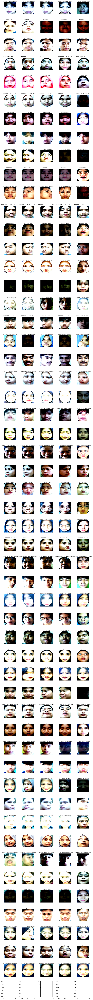

In [30]:
import matplotlib.pyplot as plt
import numpy as np
from collections import defaultdict

# Map from label index back to name
idx_to_class = {v: k for k, v in train_classifier_dataset.class_to_idx.items()}

images_per_class = 5
num_classes = len(train_classifier_dataset.class_to_idx)  # 54

# Dictionary to store images per class
class_images = defaultdict(list)

# Iterate over the entire test loader until all classes have enough images
for imgs, labels in test_classifier_loader:
    for img, label in zip(imgs, labels):
        label = label.item()
        if len(class_images[label]) < images_per_class:
            class_images[label].append(img)
    # Check if all classes have enough images
    if all(len(class_images[c]) >= images_per_class for c in range(num_classes)):
        break

# Create figure
fig, axes = plt.subplots(num_classes, images_per_class, figsize=(images_per_class*2, num_classes*2))
axes = axes.flatten()

# Plot images
idx = 0
for label in range(num_classes):
    for img in class_images[label]:
        img_np = img.permute(1, 2, 0).numpy()
        img_np = (img_np * 0.5) + 0.5  # unnormalize
        axes[idx].imshow(img_np)
        axes[idx].set_title(idx_to_class[label], fontsize=6)
        axes[idx].axis('off')
        idx += 1

plt.tight_layout()
plt.show()


In [31]:
crop_transformer.transform_folder(
    data_dir=r"D:\download_d\data",
    output_dir=r"D:\download_d\data_test"
)

D:\download_d\data\WhatsApp Image 2025-10-29 at 23.47.53_45dc57b0.jpg
[171, 125, 661, 796]
WhatsApp Image 2025-10-29 at 23.47.53_45dc57b0.jpg sudah di save


In [32]:
from torch.utils.data import DataLoader
from torchvision import transforms

# === 1. Define test transform ===
transform_test_new = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5228, 0.4082, 0.3571],
                         std=[0.1984, 0.1681, 0.1524]),
])

# === 2. Create new test dataset ===
test_dataset_new = DatasetClassification(
    data_dir=r"D:\download_d\data_test",
    extract_class_fn=extract_class,
    class_to_image_path_fn=class_to_image_path,
    transform=transform_test_new
)

# === 3. Create new DataLoader ===
test_loader_new = DataLoader(
    test_dataset_new,
    batch_size=32,
    shuffle=False
)

# === 4. Optional: check the first batch ===
imgs, labels = next(iter(test_loader_new))
print("Images shape:", imgs.shape)
print("Labels shape:", labels.shape)


Images shape: torch.Size([1, 3, 224, 224])
Labels shape: torch.Size([1])


In [44]:
model.eval()
with torch.no_grad():
    for imgs, labels in test_loader_new:
        output = model(imgs)
        output = output.numpy()
predict = knn.predict(output)

In [47]:
idx_to_class[predict[0]]

'5231811033_Rama Panji Nararendra Cahaya'

In [22]:
train_classifier_dataset.class_to_idx

{"5231811028_Ma'ruf Ndaru Sasono": 0,
 '5231811016_Kesya': 1,
 '5231911018_FIRMAN': 2,
 '5231811023_Rahma Fieka Januarni': 3,
 '5231911001_Farma': 4,
 '5231911010_Jeny Amelindrika Putri': 5,
 '5231911008_Faren': 6,
 '5231911017_RAFI AUFA MIRZA': 7,
 '5231811013_KusumaRatih': 8,
 '5221911012_Debora': 9,
 '5231811004_Hamdanu Fahmi Utomo': 10,
 '5231811033_Rama Panji Nararendra Cahaya': 11,
 '5221911025_Anggun': 12,
 '5231811037_Muhammad Ibra Ramadhon': 13,
 '5231911009_Ica Nurcahya': 14,
 '5231811029_Andini': 15,
 '5231811021_NASHA SHINTA A': 16,
 '5231811005_Akhmad Nabil Saputra': 17,
 '5231811031_CindyKusumaningrum': 18,
 '5231911004_al faisal selan': 19,
 '5231811034_Shilsylia Putri Devitasary': 20,
 '5231811007_Amalia Dwi Ramadhani': 21,
 '5231911006_ARI DHARMA DEVANANTA': 22,
 '5231911011_Nirmala Fitri Margitaya': 23,
 '5231911012_Thalita Revalyna Maharani': 24,
 '5231811019_Chronika': 25,
 '5231811025_Novera': 26,
 '5231811008_Sophia': 27,
 '5231811018_Sulis Septiani Putri': 28,
 '

In [18]:
data = train_classifier_dataset.classes

# Create a new list with only the numeric parts
numbers_only = [item.split('_')[0] for item in data]

# Check the length of the new list
print("New list:", numbers_only)
print("Length of new list:", len(numbers_only))

New list: ['5231811028', '5231811016', '5231911018', '5231811023', '5231911001', '5231911010', '5231911008', '5231911017', '5231811013', '5221911012', '5231811004', '5231811033', '5221911025', '5231811037', '5231911009', '5231811029', '5231811021', '5231811005', '5231811031', '5231911004', '5231811034', '5231811007', '5231911006', '5231911011', '5231911012', '5231811019', '5231811025', '5231811008', '5231811018', '5231811038', '5231911002', '5231811036', '5231911020', '5231811022', '5231811027', '5231811024', '5231911007', '5231811002', '5231911019', '5231911016', '5231811039', '5231811009', '5231811010', '5231811035', '5231811030', '5231811014', '5231811017', '5231911003', '5231911005', '5231811006', '5231811015', '5231811026', '5231811002', '5231911013']
Length of new list: 54


In [64]:
# train_classifier_dataset[500][0]

In [81]:
def training_model_classification(model, optimizer, scheduler, criterion, epochs):
    for epoch in range(epochs):
        print(f"Epoch {epoch+1}/{epochs} - Training")
        model.train()
        running_loss = 0.0
        running_corrects = 0
        total_samples = 0

        for i, (inputs, labels) in enumerate(train_loader):
            inputs = inputs.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()

            outputs = model(inputs)  # forward pass
            loss = criterion(outputs, labels)
            loss.requires_grad = True
            loss.backward()
            optimizer.step()
            scheduler.step()

            running_loss += loss.item() * inputs.size(0)

            # calculate accuracy
            _, preds = torch.max(outputs, 1)
            running_corrects += torch.sum(preds == labels).item()
            total_samples += inputs.size(0)
            
            if i % 64 == 0:
                print(f"[Batch {i+1}] Loss: {running_loss/total_samples:.4f} | Acc: {running_corrects/total_samples:.4f}")

        epoch_loss = running_loss / total_samples
        epoch_acc = running_corrects / total_samples
        print(f"[Epoch {epoch+1}] Training Loss: {epoch_loss:.4f} | Training Acc: {epoch_acc:.4f}")

        # Evaluate on test/validation set
        model.eval()
        test_loss = 0.0
        test_corrects = 0
        test_samples = 0
        with torch.no_grad():
            for inputs, labels in test_loader:
                inputs = inputs.to(device)
                labels = labels.to(device)

                outputs = model(inputs)
                loss = criterion(outputs, labels)
                test_loss += loss.item() * inputs.size(0)

                _, preds = torch.max(outputs, 1)
                test_corrects += torch.sum(preds == labels).item()
                test_samples += inputs.size(0)

        test_loss /= test_samples
        test_acc = test_corrects / test_samples
        print(f"[Epoch {epoch+1}] Test Loss: {test_loss:.4f} | Test Acc: {test_acc:.4f}\n")

    print("Training finished!")
    return model

In [70]:
path = r"D:\Code\Kuliah\Deep Learning\Tugas 2\data\Dataset Sistem Presensi Wajah V1.0\Data Train"
len(list(set(extract_class(i) for i in os.listdir(path))))

54

In [54]:
model_classification = model

In [82]:
 # = torchvision.models.resnet18(weights='IMAGENET1K_V1')
from torch.optim import lr_scheduler
for param in model_classification.parameters():
    param.requires_grad = False

# Parameters of newly constructed modules have requires_grad=True by default
num_ftrs = model_classification.resnet.fc.in_features
model_classification.fc = nn.Linear(num_ftrs, 54)

for param in model_classification.fc.parameters():
    param.requires_grad = True
    
model_classification = model_classification.to(device)

criterion = nn.CrossEntropyLoss()

# Observe that only parameters of final layer are being optimized as
# opposed to before.
optimizer_conv = optim.SGD(model_classification.fc.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_conv, step_size=7, gamma=0.1)

In [83]:
# for param in model_classification.fc.parameters():
#     param.requires_grad = True
#     print(param)

In [85]:
model = training_model_classification(
    model=model_classification,
    optimizer=optimizer_conv, 
    scheduler=exp_lr_scheduler, 
    criterion=criterion, 
    epochs=5
)

Epoch 1/5 - Training
[Batch 1] Loss: 4.9240 | Acc: 0.0000
[Epoch 1] Training Loss: 5.0347 | Training Acc: 0.0012
[Epoch 1] Test Loss: 5.0322 | Test Acc: 0.0000

Epoch 2/5 - Training
[Batch 1] Loss: 5.0085 | Acc: 0.0000
[Epoch 2] Training Loss: 5.0309 | Training Acc: 0.0000
[Epoch 2] Test Loss: 5.0232 | Test Acc: 0.0000

Epoch 3/5 - Training
[Batch 1] Loss: 5.1259 | Acc: 0.0000
[Epoch 3] Training Loss: 5.0322 | Training Acc: 0.0000
[Epoch 3] Test Loss: 5.0291 | Test Acc: 0.0000

Epoch 4/5 - Training
[Batch 1] Loss: 5.0869 | Acc: 0.0000
[Epoch 4] Training Loss: 5.0329 | Training Acc: 0.0006
[Epoch 4] Test Loss: 5.0266 | Test Acc: 0.0000

Epoch 5/5 - Training
[Batch 1] Loss: 4.9109 | Acc: 0.0000
[Epoch 5] Training Loss: 5.0313 | Training Acc: 0.0006
[Epoch 5] Test Loss: 5.0302 | Test Acc: 0.0000

Training finished!
